In [3]:
# colab only
# !pip install tf-nightly

In [4]:
import tensorflow as tf
import tensorflow_addons as tfa
import matplotlib.pyplot as plt
import numpy as np

import pathlib
import pydot
import PIL
from PIL import Image

from utilities import utils, metrics

In [5]:
# from google.colab import drive
# drive.mount('/content/drive')

In [6]:
DRIVE_FOLDER = "../food201/" # "/content/drive/My Drive/food201"

In [7]:
SUBSET_FOLDER = ""

In [8]:
TRAIN_DATA_FOLDER = pathlib.Path(DRIVE_FOLDER + SUBSET_FOLDER + "/segmented_train")
TEST_DATA_FOLDER = pathlib.Path(DRIVE_FOLDER + SUBSET_FOLDER + "/segmented_test")

TRAIN_MASK_FOLDER = pathlib.Path(DRIVE_FOLDER + SUBSET_FOLDER + "/new_masks_train")
TEST_MASK_FOLDER = pathlib.Path(DRIVE_FOLDER + SUBSET_FOLDER + "/new_masks_test")

## Settings

In [9]:
IMAGE_WIDTH = utils.IMAGE_WIDTH
IMAGE_HEIGHT = utils.IMAGE_HEIGHT

In [10]:
CLASSES = utils.CLASSES

## Load data

In [11]:
def load_filenames(data_dir):
    image_count = len(list(data_dir.glob('*/*.jpg')))
    print(f"Prefetched: {image_count} images")
    test_filenames = tf.data.Dataset.list_files(str(data_dir/'*/*'), shuffle=False)
    return image_count, test_filenames.shuffle(image_count, reshuffle_each_iteration=False)

In [12]:
TEST_SIZE, test_data = load_filenames(TEST_DATA_FOLDER)

Prefetched: 2439 images


In [13]:
TRAIN_SIZE, train_data = load_filenames(TRAIN_DATA_FOLDER)


Prefetched: 9654 images


## Create `image, label` tuples

In [14]:
def get_mask(image_path):
    # Produce correct path.
    mask_path = tf.strings.regex_replace(image_path, 'segmented', 'fixed_masks')
    mask_file = tf.strings.regex_replace(mask_path, '.jpg', '.png')

    def load_mask(path):
        image = Image.open(path.numpy().decode()).resize((IMAGE_HEIGHT, IMAGE_WIDTH), resample=PIL.Image.NEAREST)
        image_array = np.array(image)
        return image_array.reshape(image_array.shape + (1,))
    
    mask = tf.py_function(load_mask, [mask_file], tf.uint8)
    return tf.ensure_shape(mask, shape=[IMAGE_HEIGHT,IMAGE_WIDTH,1])

    # mask = tf.io.read_file(mask_file)
    # mask = tf.image.decode_png(mask)

    # Resize using nearest neighbor to avoid introducing non-existent labels.
    #return tf.image.resize(mask, [IMAGE_HEIGHT, IMAGE_WIDTH], method='nearest')


In [15]:
def get_image(image_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)
    return tf.image.resize(image, [IMAGE_HEIGHT, IMAGE_WIDTH])  # Necessary for meaningful batching.

In [16]:
def prepare_example(image_path):
    image = get_image(image_path)
    mask = get_mask(image_path)
    return image, mask

In [17]:
# Process datasets.
train_data = train_data.map(prepare_example, num_parallel_calls=tf.data.experimental.AUTOTUNE, deterministic=False)
test_data = test_data.map(prepare_example, num_parallel_calls=tf.data.experimental.AUTOTUNE, deterministic=False)

## Create validation split

In [18]:
VAL_RATIO = 0.75

In [19]:
train_indices = np.random.choice(range(TRAIN_SIZE), int(VAL_RATIO * TRAIN_SIZE), replace=False)
print(f"Train size: {train_indices.shape[0]}")

Train size: 7240


In [20]:
val_indices = list(set(range(TRAIN_SIZE)) - set(train_indices))
print(f"Validation size: {len(val_indices)}")

Validation size: 2414


In [21]:
def subset_dataset(dataset, indices):
    return dataset.enumerate().filter(lambda i, t: tf.reduce_any(i == indices)).map(lambda j, u: u)

In [22]:
train_data = subset_dataset(train_data, train_indices)
val_data = subset_dataset(train_data, val_indices)

In [25]:
def iou(y_true, y_pred):
    """
    Returns mean IoU of all classes.
    """
    y_true = tf.reshape(y_true, [utils.IMAGE_HEIGHT * utils.IMAGE_WIDTH])
    classes, _ = tf.unique(y_true)

    y_pred = tf.math.argmax(y_pred, axis=-1)

    y_pred = tf.reshape(y_pred, [utils.IMAGE_HEIGHT * utils.IMAGE_WIDTH])
    vals,_, counts = tf.unique_with_counts(y_pred)
    print(vals)
    print(counts)

    vals,_, counts = tf.unique_with_counts(y_true)
    print(vals)
    print(counts)

    iou_list = tf.TensorArray(tf.float32, size=0, dynamic_size=True)
 
    for cls in classes:
        y_true_mask = tf.math.equal(y_true, cls)
        y_pred_mask = tf.math.equal((tf.cast(y_pred, tf.uint8)), cls)

        intersection_mask = tf.math.logical_and(y_true_mask, y_pred_mask)
        union_mask = tf.math.logical_or(y_true_mask, y_pred_mask)

        intersection = tf.reduce_sum(tf.cast(intersection_mask, tf.float32))
        union = tf.reduce_sum(tf.cast(union_mask, tf.float32))
        print(f"[{cls}] {intersection} / {union}")
        # Safeguard zero division.
        iou = intersection / union
        iou_list = iou_list.write(iou_list.size(), iou)

        print(iou)
    return tf.reduce_mean(iou_list.concat())

In [26]:
for img, mask in train_data:
    print(iou(mask, mask))
    break

tf.Tensor([0], shape=(1,), dtype=int64)
tf.Tensor([16384], shape=(1,), dtype=int32)
tf.Tensor([  0  53 163], shape=(3,), dtype=uint8)
tf.Tensor([13665   674  2045], shape=(3,), dtype=int32)
[0] 13665.0 / 16384.0
tf.Tensor(0.8340454, shape=(), dtype=float32)
[53] 0.0 / 674.0
tf.Tensor(0.0, shape=(), dtype=float32)
[163] 0.0 / 2045.0
tf.Tensor(0.0, shape=(), dtype=float32)
tf.Tensor(0.27801514, shape=(), dtype=float32)


## Batching and caching

In [42]:
SHUFFLE_BUFFER = 100
BATCH_SIZE = 16

In [22]:
def cache_oneoff_tasks(dataset):
  dataset = dataset.cache()
  dataset = dataset.shuffle(buffer_size=SHUFFLE_BUFFER)
  dataset = dataset.batch(BATCH_SIZE)
  dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
  return dataset

def cache_oneoff_tasks(dataset):
  dataset = dataset.cache()
  dataset = dataset.shuffle(buffer_size=SHUFFLE_BUFFER)
  dataset = dataset.batch(BATCH_SIZE)
  dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
  return dataset

train_data = cache_oneoff_tasks(train_data)
val_data = cache_oneoff_tasks(val_data) # Shuffle too, so we see difference pictures in callback

(128, 128, 1)
[  0 115 164 193] [9081 3868 2178 1257]
(128, 128, 1)
[ 0 32 65] [9227 4766 2391]
(128, 128, 1)
[ 0 12] [16012   372]


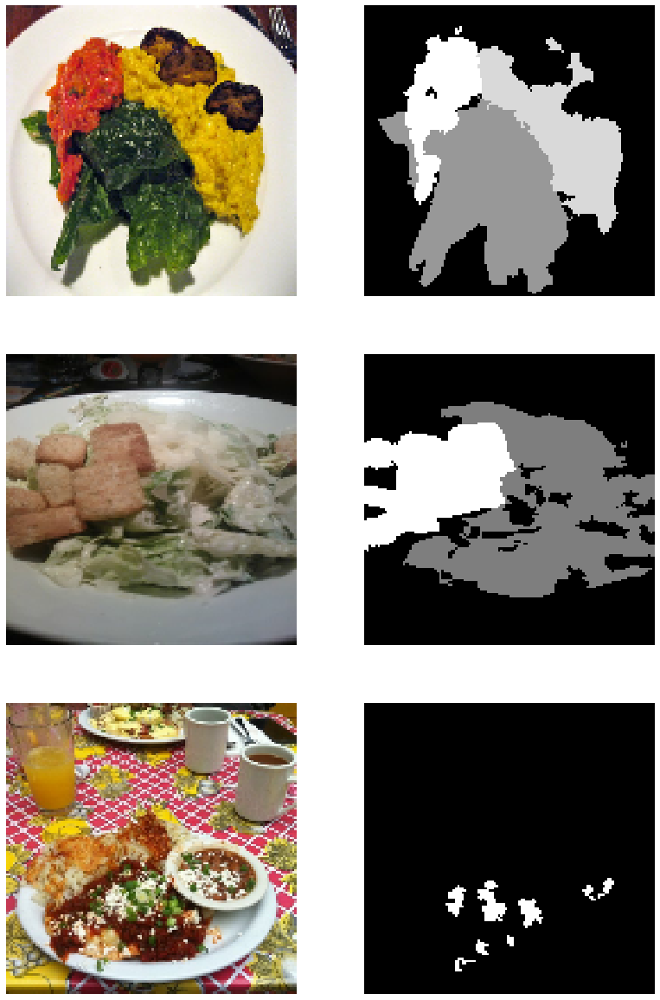

In [23]:
plt.figure(figsize=(21, 7 * 3))

for i, (image, mask) in enumerate(val_data.take(3)):
    vals, counts = np.unique(mask[0].numpy(),return_counts=True)
    print(mask[0].numpy().shape)
    print(vals, counts)
    ax = plt.subplot(3, 3, 3*i+1)
    plt.imshow(image[0].numpy().astype("uint8"))
    plt.axis("off")

    ax = plt.subplot(3, 3, 3*i+2)
    plt.imshow(mask[0].numpy().astype("uint8").squeeze(axis=2), cmap='gray', vmin=0, vmax=tf.math.reduce_max(mask[0]))
    plt.axis("off")

## Image augmentations

In [24]:
# TODO: Flips, HSV, ...

## Vizualization callback

In [25]:
# Visualization callback to see how mask prediction progresses.
class MaskCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        plot_mask_predictions(val_data, 3)

def create_mask(pred_mask):
  pred_mask = tf.argmax(pred_mask, axis=-1)
  pred_mask = pred_mask[..., tf.newaxis]
  return pred_mask[0]

In [26]:
def plot_mask_predictions(dataset, examples=3):
    plt.figure(figsize=(21, 7 * examples))

    for i, (image, mask) in enumerate(dataset.take(examples)):
        ax = plt.subplot(examples, 3, 3*i+1)
        plt.imshow(image[0].numpy().astype("uint8"))
        plt.axis("off")

        ax = plt.subplot(examples, 3, 3*i+2)
        plt.imshow(mask[0].numpy().astype("uint8").squeeze(axis=2), cmap='gray', vmin=0, vmax=tf.math.reduce_max(mask[0]))
        plt.axis("off")


        pred_mask = create_mask(model.predict(image))

        ax = plt.subplot(examples, 3, 3*i+3)
        plt.imshow(pred_mask.numpy().astype("uint8").squeeze(axis=2), cmap='gray', vmin=0, vmax=tf.math.reduce_max(pred_mask))
        plt.axis("off")

    plt.show()

## Load MobileNet v3

In [29]:
# IMPORTANT: Run this just once per Jupyter kernel start since new loads increase layer numbers.
mobile_net = tf.keras.applications.MobileNetV3Large(
    input_shape=(IMAGE_HEIGHT, IMAGE_WIDTH, 3), alpha=1.0, minimalistic=False, include_top=False,
    weights='imagenet', input_tensor=None, pooling=None,
    dropout_rate=0.2
)

In [30]:
# U-net encoder skips.
encoder_layers = [
    're_lu_2',   # \2^1
    're_lu_6',   # \2^2
    'multiply_1',   # \2^3
    'multiply_13',  # \2^4
    'Conv_1',      # \2^5 (7x7 for 224x224)
]

encoder = [mobile_net.get_layer(l).output for l in encoder_layers]
encoder = tf.keras.Model(inputs=mobile_net.input, outputs=encoder)

In [31]:
# Don't train 'imagenet' weights.
encoder.trainable = False

## Segmentation head

In [32]:
# U-net decoder.
def upsampling_layer(inputs, filters, kernel=(3,3), strides=(2,2), padding='same', dropout=None):
    """
    General Conv2DTranspose -> GN -> (Dropout) -> ReLU layer.
    """
    x = tf.keras.layers.Conv2DTranspose(filters, kernel, strides=strides, padding=padding, use_bias=False)(inputs)
    x = tfa.layers.GroupNormalization(groups=16)(x)
    
    if dropout is not None:
        x = tf.keras.layers.Dropout(rate=dropout)(x)
    x = tf.keras.layers.ReLU()(x)
    return x

In [33]:
decoder_filters = [512, 256, 128, 64, 32]  # Number of filters as we progress down the decoder.

In [34]:
# More models constants.
FINAL_DECONV_FILTER = 16
PROB_TOP = 6 # And background.

DROPOUT = 0.3

In [35]:
def squish_improbable_classes(batch):
    vals, ind = tf.math.top_k(batch, k=PROB_TOP, sorted=False)

    batch_1 = tf.expand_dims(tf.range(0, tf.shape(batch)[0]), 1)  # One value list per batch item.
    batch_k = tf.tile(batch_1, [1, PROB_TOP])  # k value list per batch item.
    full_ind = tf.concat([tf.expand_dims(batch_k, -1), tf.expand_dims(ind, -1)], axis=2)
    full_ind = tf.reshape(full_ind, [-1, 2])  # 2D shape (BATCH * CLASSES)

    vals = tf.reshape(vals, [-1])
    return tf.scatter_nd(full_ind, vals, shape=tf.shape(batch))

In [36]:
inputs = tf.keras.layers.Input(shape=[IMAGE_HEIGHT, IMAGE_WIDTH, 3])

# Encoding.
# Set `training` to false to keep BN in inference mode for fine tuning.
encoder_outputs = encoder(inputs, training=False)

# Last model layer output.
x = encoder_outputs[-1]
# Reverse since we go from smallest to largest.
encoder_outputs = reversed(encoder_outputs[:-1])

# Forming U-net.
for encoder_output, filters in zip(encoder_outputs, decoder_filters):
    decoder_output = upsampling_layer(x, filters, dropout=DROPOUT)
    x = tf.keras.layers.Concatenate()([decoder_output, encoder_output]) # Skip connection.

# Get mask back to original size.
x = upsampling_layer(x, FINAL_DECONV_FILTER)
    
# Split the final output into classification and segmentation head.
class_output = tf.keras.layers.Flatten()(x)
class_output = tf.keras.layers.Dense(CLASSES, activation=tf.nn.softmax)(class_output)
# Ignore improbable classes.
# class_output = tf.keras.layers.Lambda(lambda probs: squish_improbable_classes(probs))(class_output)

segmented_output = tf.keras.layers.Conv2D(CLASSES, 3, strides=1, padding='same', activation=tf.nn.softmax)(x)

# Mask out improbable classes.
outputs = tf.keras.layers.Multiply()([segmented_output, class_output])

model = tf.keras.Model(inputs=inputs, outputs=outputs)

In [37]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(),
              metrics=['accuracy'])

## Model training

In [38]:
EPOCHS = 10

In [39]:
# ============================
# !!!!!! SET NEW RUN ID !!!!!!
# ============================
cp_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath="checkpoints/run_02/cp-{epoch:04d}.ckpt", 
    verbose=1, 
    save_weights_only=True)

Epoch 1/10
453/453 [==============================] - 1414s 3s/step - loss: 3.1241 - accuracy: 0.5659 - val_loss: 2.5708 - val_accuracy: 0.5815


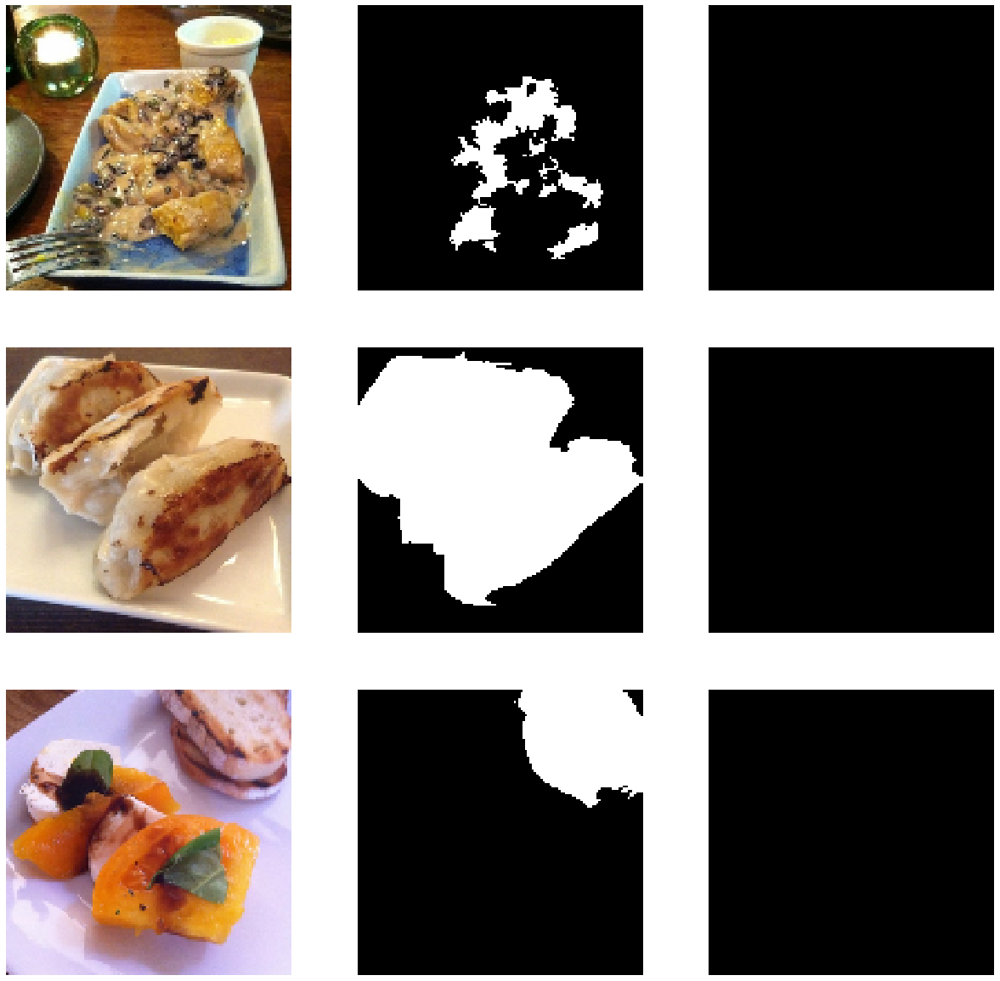


Epoch 00001: saving model to checkpoints/run_02\cp-0001.ckpt
Epoch 2/10
453/453 [==============================] - 1397s 3s/step - loss: 2.5979 - accuracy: 0.5749 - val_loss: 2.5461 - val_accuracy: 0.5815


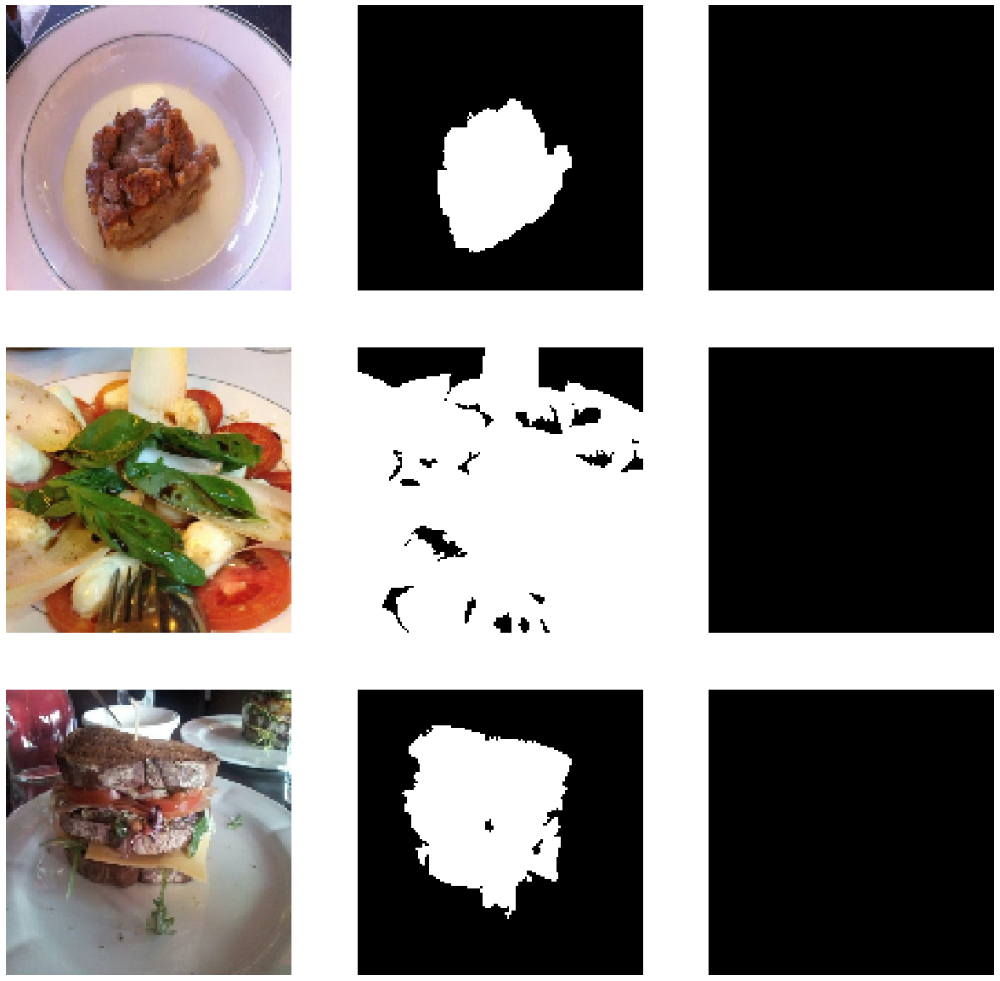


Epoch 00002: saving model to checkpoints/run_02\cp-0002.ckpt
Epoch 3/10
453/453 [==============================] - 1893s 4s/step - loss: 2.5791 - accuracy: 0.5750 - val_loss: 2.5381 - val_accuracy: 0.5815


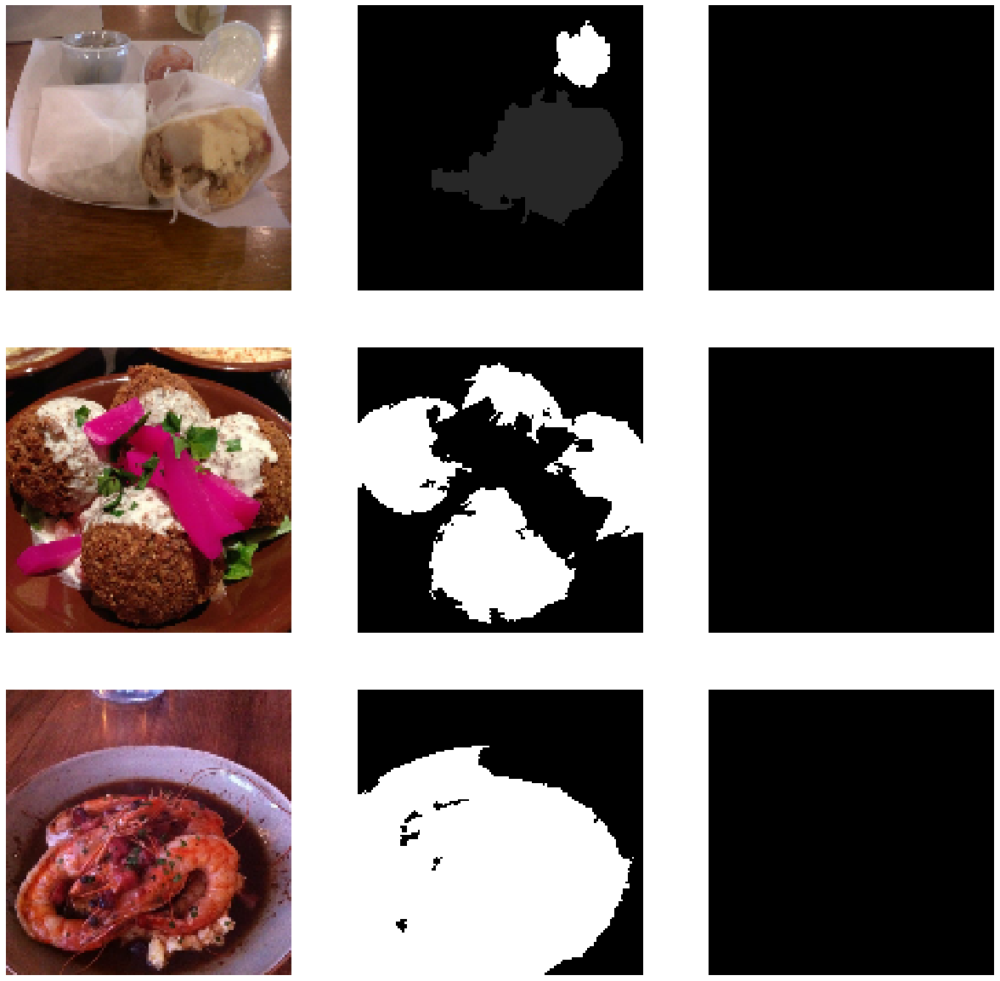


Epoch 00003: saving model to checkpoints/run_02\cp-0003.ckpt
Epoch 4/10
453/453 [==============================] - 1612s 4s/step - loss: 2.5661 - accuracy: 0.5753 - val_loss: 2.5222 - val_accuracy: 0.5815


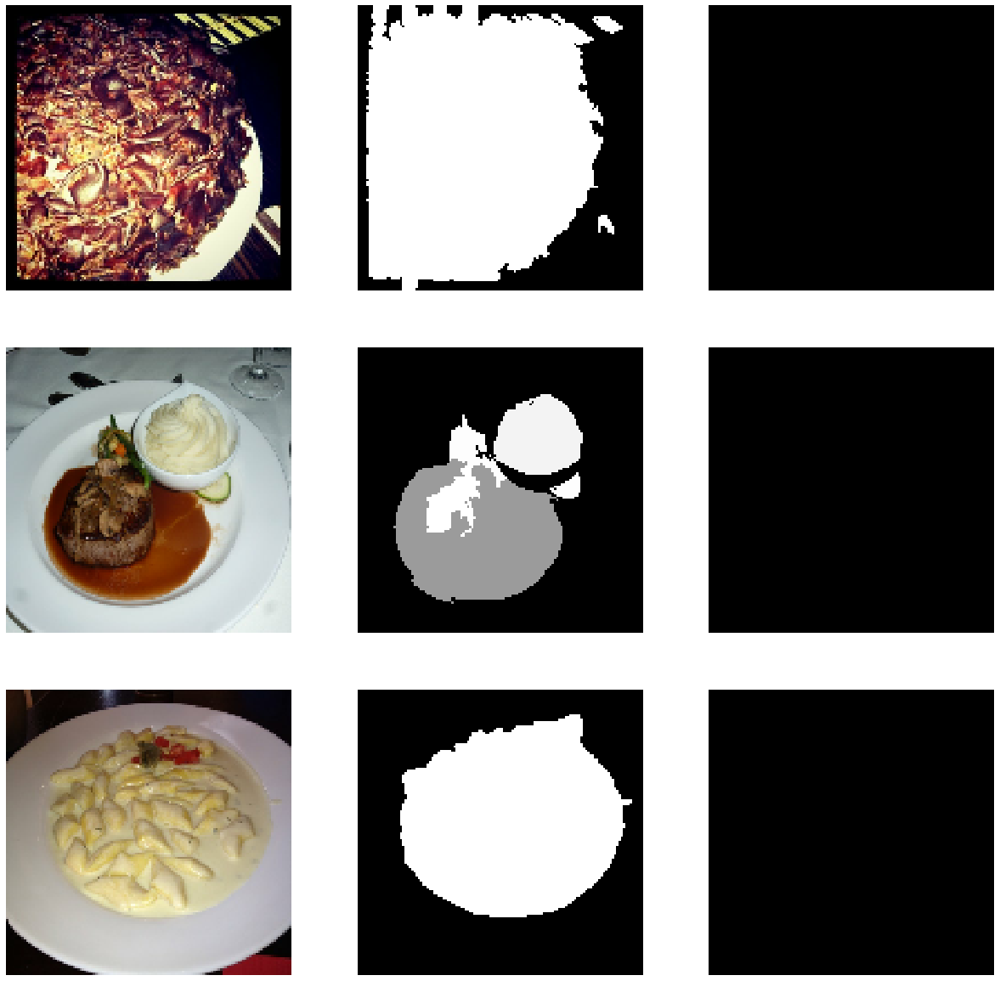


Epoch 00004: saving model to checkpoints/run_02\cp-0004.ckpt
Epoch 5/10
431/453 [===========================>..] - ETA: 1:05 - loss: 2.5515 - accuracy: 0.5756

In [40]:
model_history = model.fit(
    train_data, 
    epochs=EPOCHS, 
    validation_data=val_data, 
    callbacks=[MaskCallback(), cp_callback]
)

(16, 128, 128, 1)
(16, 128, 128, 1)
(16, 128, 128, 1)


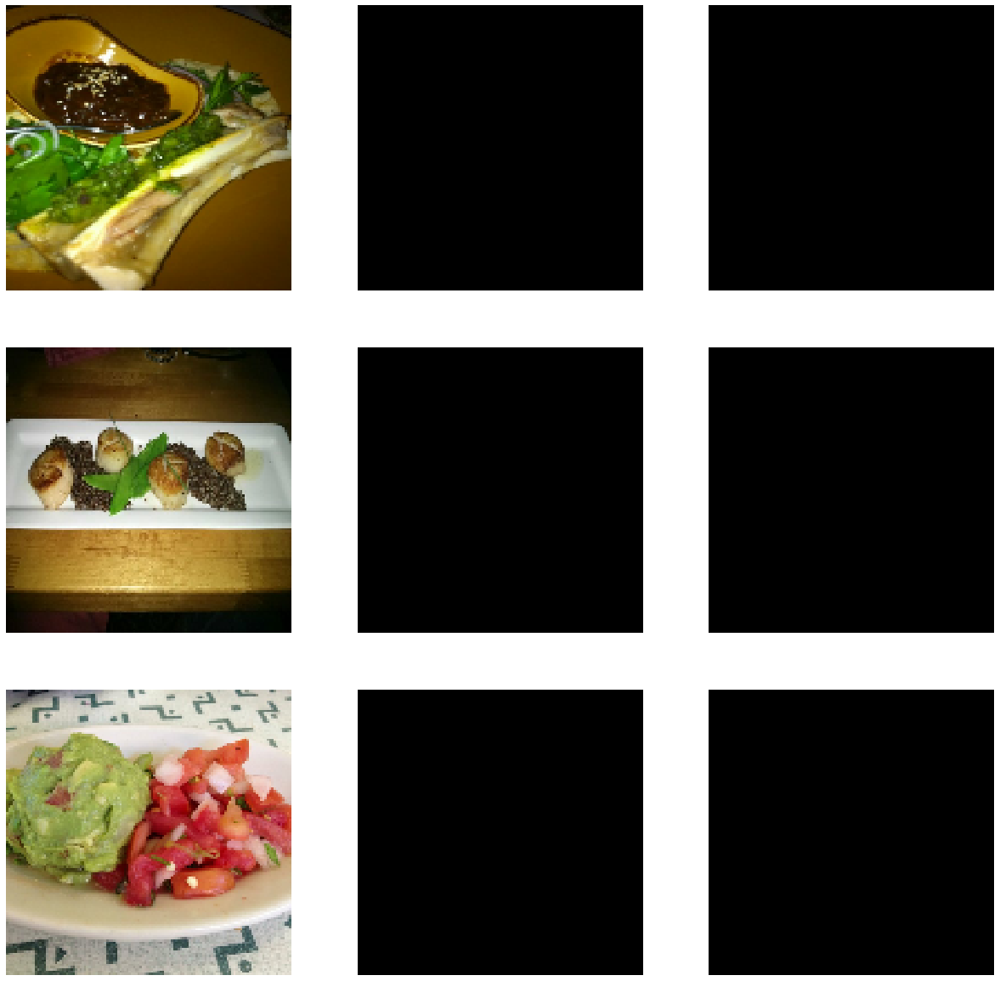

In [39]:
plot_mask_predictions(val_data, examples=3)

In [88]:
cp_fine_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath="checkpoints/run_02/cp-{epoch:04d}.ckpt", 
    verbose=1, 
    save_weights_only=True)

Epoch 10/30
453/453 [==============================] - 941s 2s/step - loss: 1.5037 - accuracy: 0.6857 - val_loss: 1.3488 - val_accuracy: 0.6619
(16, 128, 128, 1)
(16, 128, 128, 1)
(16, 128, 128, 1)


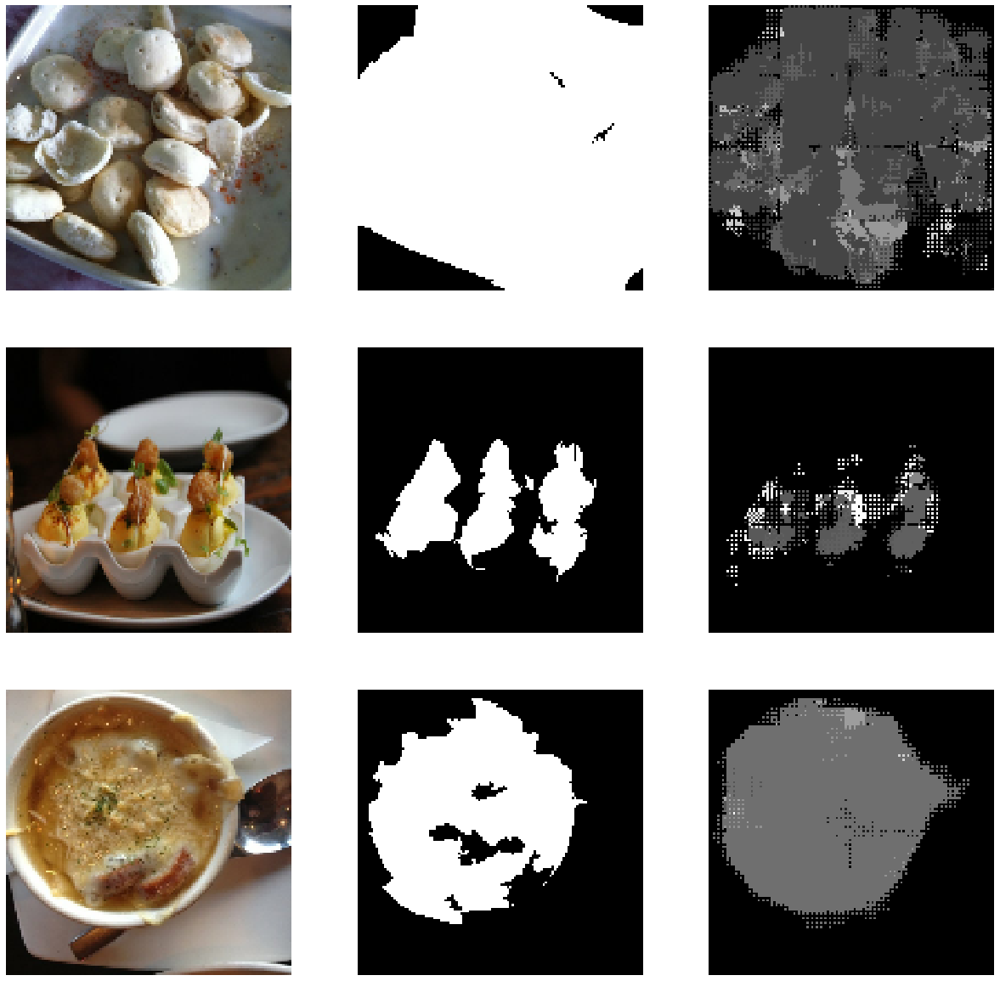


Epoch 00010: saving model to checkpoints/run_02\cp-0010.ckpt
Epoch 11/30
453/453 [==============================] - 951s 2s/step - loss: 1.4319 - accuracy: 0.6758 - val_loss: 1.3138 - val_accuracy: 0.6496
(16, 128, 128, 1)
(16, 128, 128, 1)
(16, 128, 128, 1)


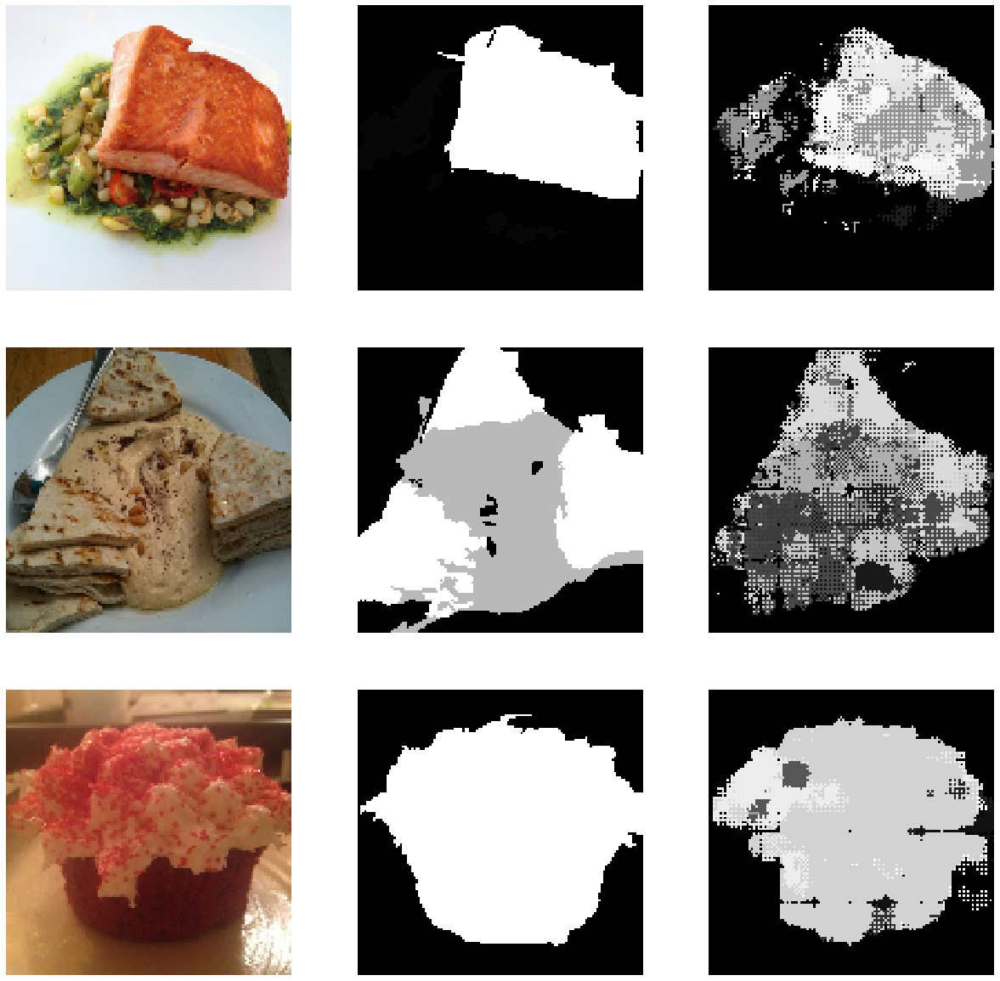


Epoch 00011: saving model to checkpoints/run_02\cp-0011.ckpt
Epoch 12/30
453/453 [==============================] - 962s 2s/step - loss: 1.3592 - accuracy: 0.6673 - val_loss: 1.2719 - val_accuracy: 0.6526
(16, 128, 128, 1)
(16, 128, 128, 1)
(16, 128, 128, 1)


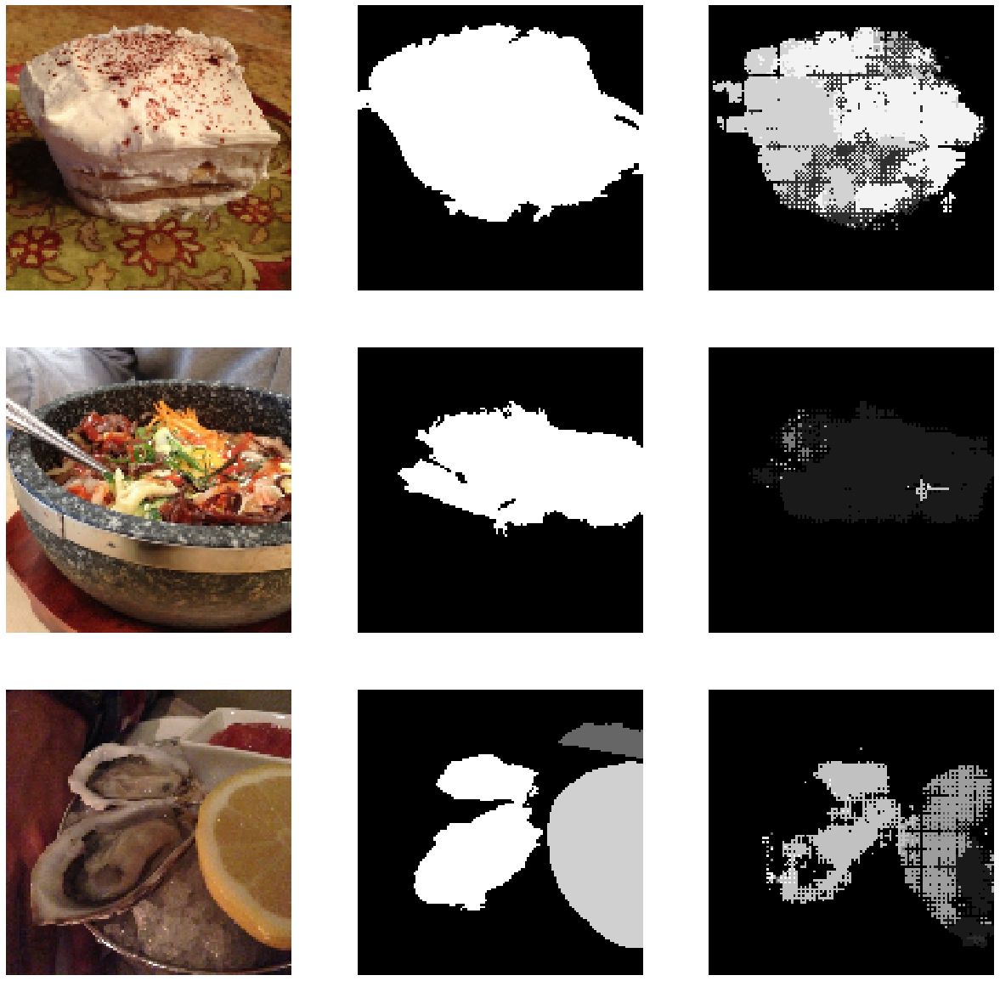


Epoch 00012: saving model to checkpoints/run_02\cp-0012.ckpt
Epoch 13/30
453/453 [==============================] - 965s 2s/step - loss: 1.2924 - accuracy: 0.6603 - val_loss: 1.1944 - val_accuracy: 0.6582
(16, 128, 128, 1)
(16, 128, 128, 1)
(16, 128, 128, 1)


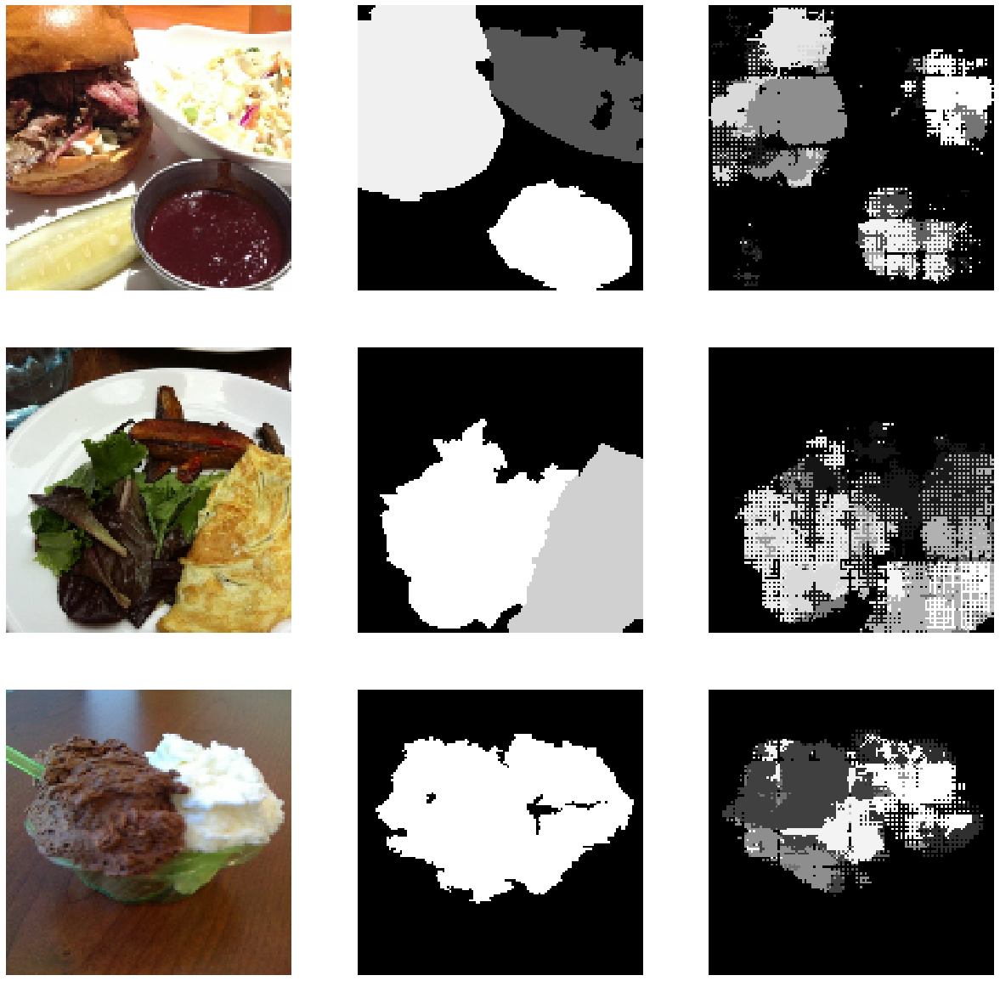


Epoch 00013: saving model to checkpoints/run_02\cp-0013.ckpt
Epoch 14/30
453/453 [==============================] - 964s 2s/step - loss: 1.2203 - accuracy: 0.6523 - val_loss: 1.1413 - val_accuracy: 0.6439
(16, 128, 128, 1)
(16, 128, 128, 1)
(16, 128, 128, 1)


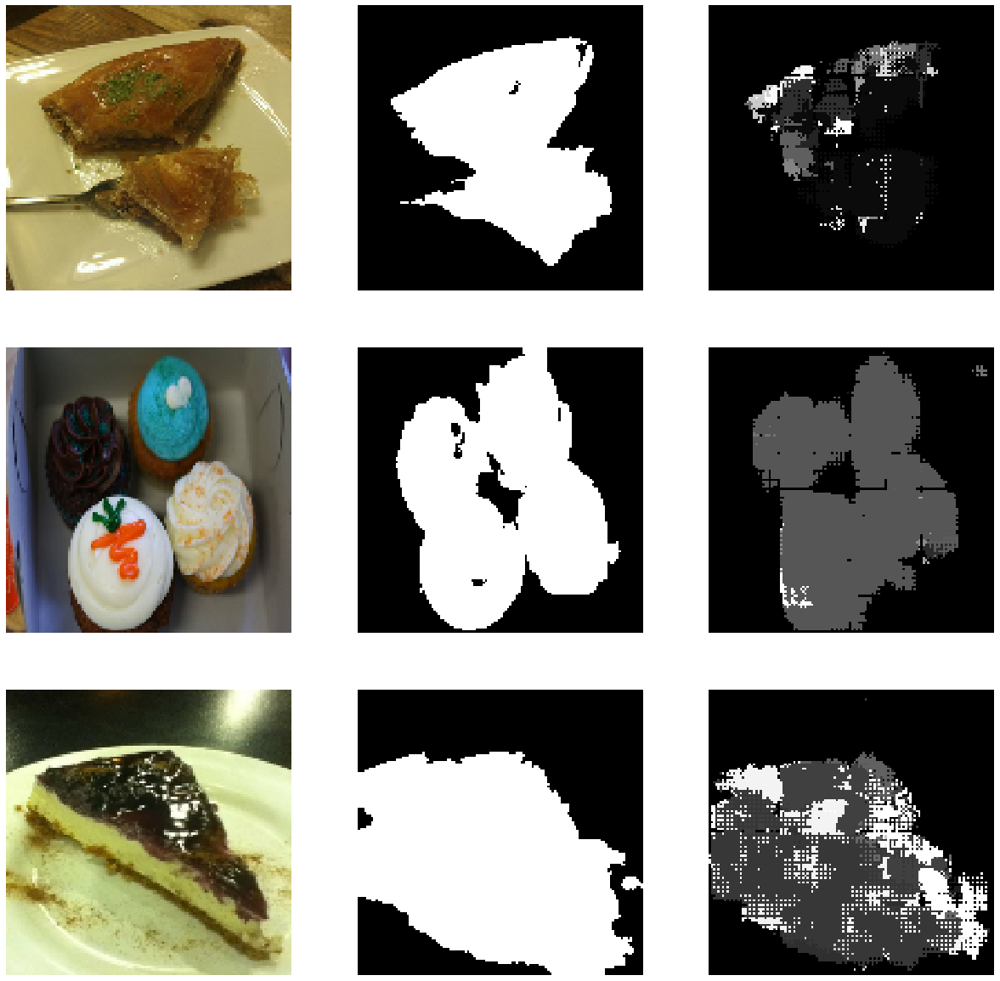


Epoch 00014: saving model to checkpoints/run_02\cp-0014.ckpt
Epoch 15/30
453/453 [==============================] - 976s 2s/step - loss: 1.1634 - accuracy: 0.6465 - val_loss: 1.1252 - val_accuracy: 0.6104
(16, 128, 128, 1)
(16, 128, 128, 1)
(16, 128, 128, 1)


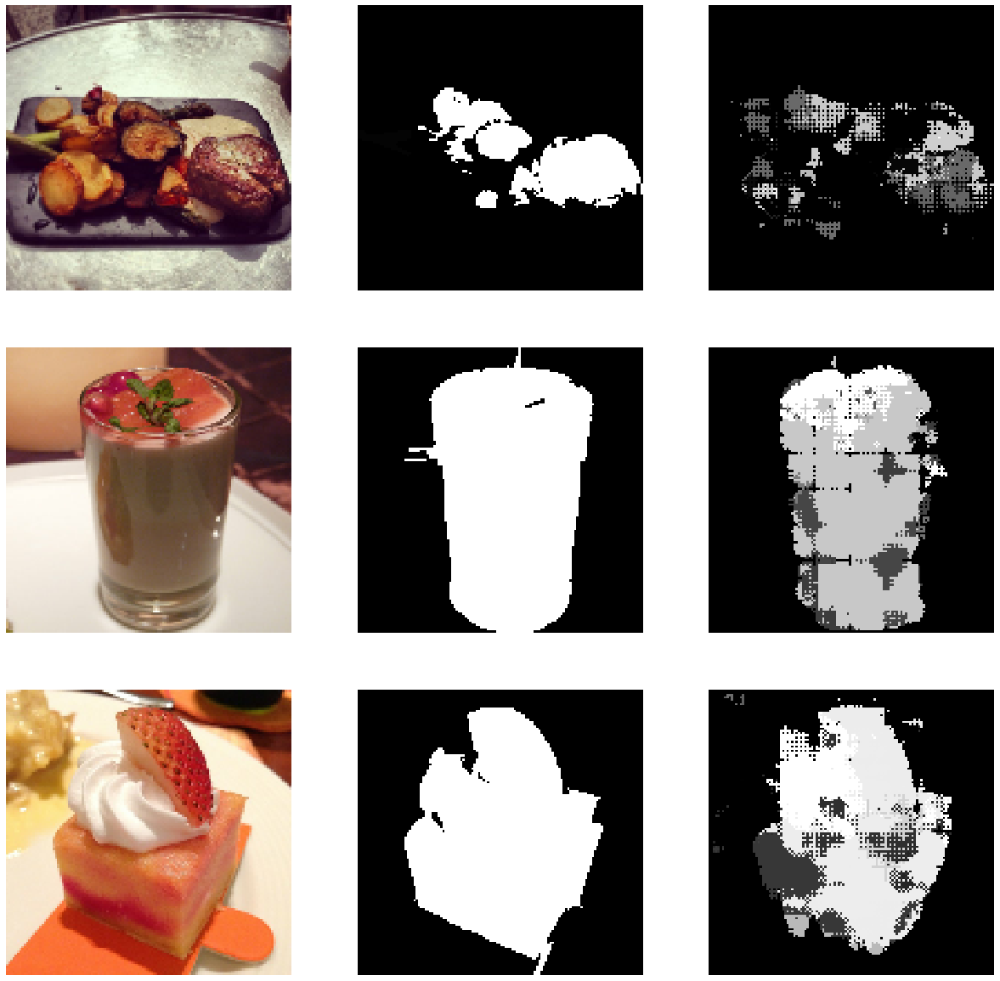


Epoch 00015: saving model to checkpoints/run_02\cp-0015.ckpt
Epoch 16/30
453/453 [==============================] - 973s 2s/step - loss: 1.1012 - accuracy: 0.6409 - val_loss: 1.0742 - val_accuracy: 0.7098
(16, 128, 128, 1)
(16, 128, 128, 1)
(16, 128, 128, 1)


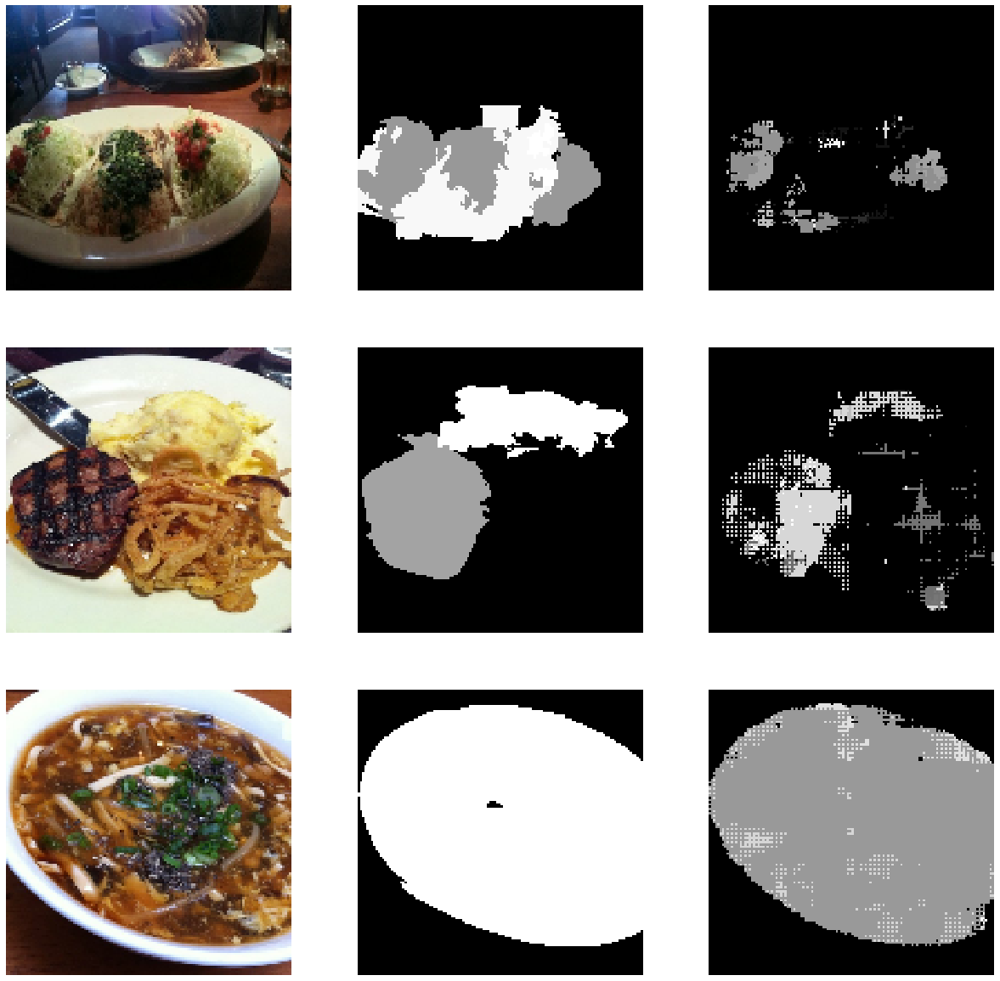


Epoch 00016: saving model to checkpoints/run_02\cp-0016.ckpt
Epoch 17/30
453/453 [==============================] - 981s 2s/step - loss: 1.0517 - accuracy: 0.6366 - val_loss: 1.0268 - val_accuracy: 0.6513
(16, 128, 128, 1)
(16, 128, 128, 1)
(16, 128, 128, 1)


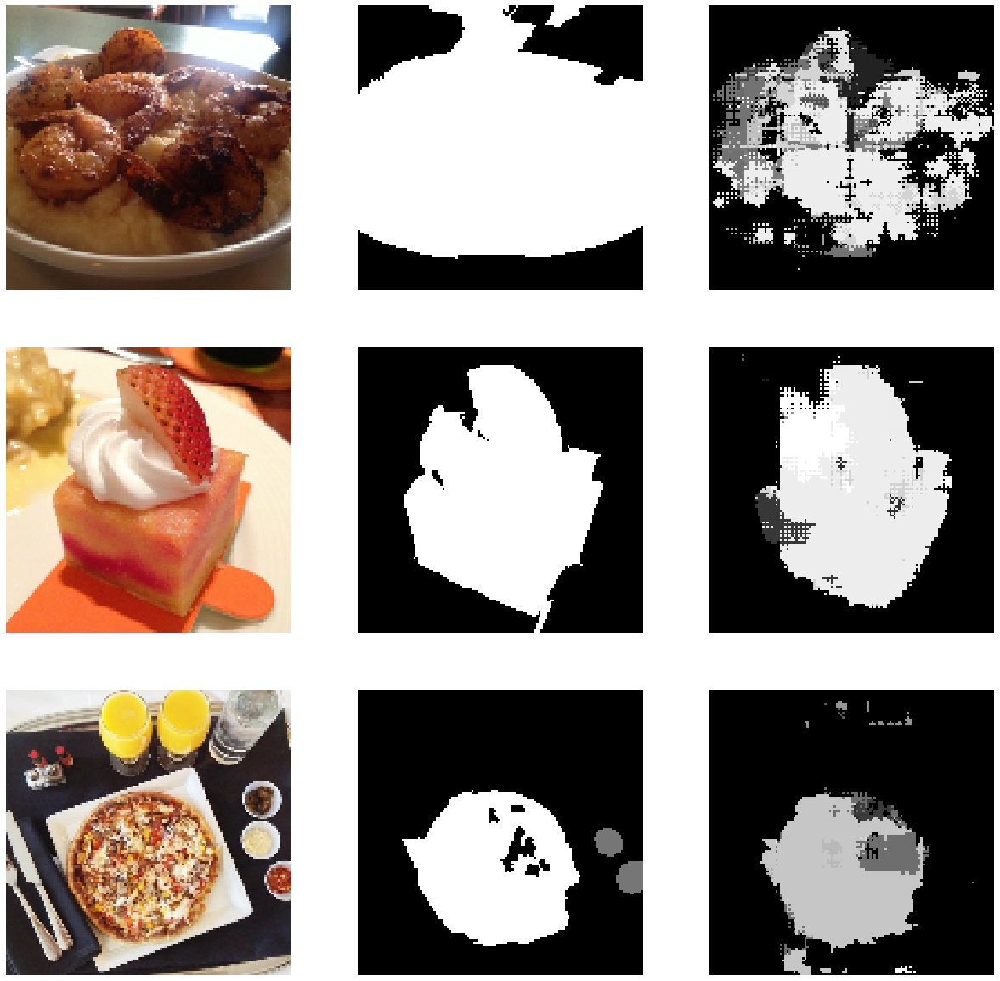


Epoch 00017: saving model to checkpoints/run_02\cp-0017.ckpt
Epoch 18/30
453/453 [==============================] - 975s 2s/step - loss: 0.9930 - accuracy: 0.6321 - val_loss: 0.9621 - val_accuracy: 0.6202
(16, 128, 128, 1)
(16, 128, 128, 1)
(16, 128, 128, 1)


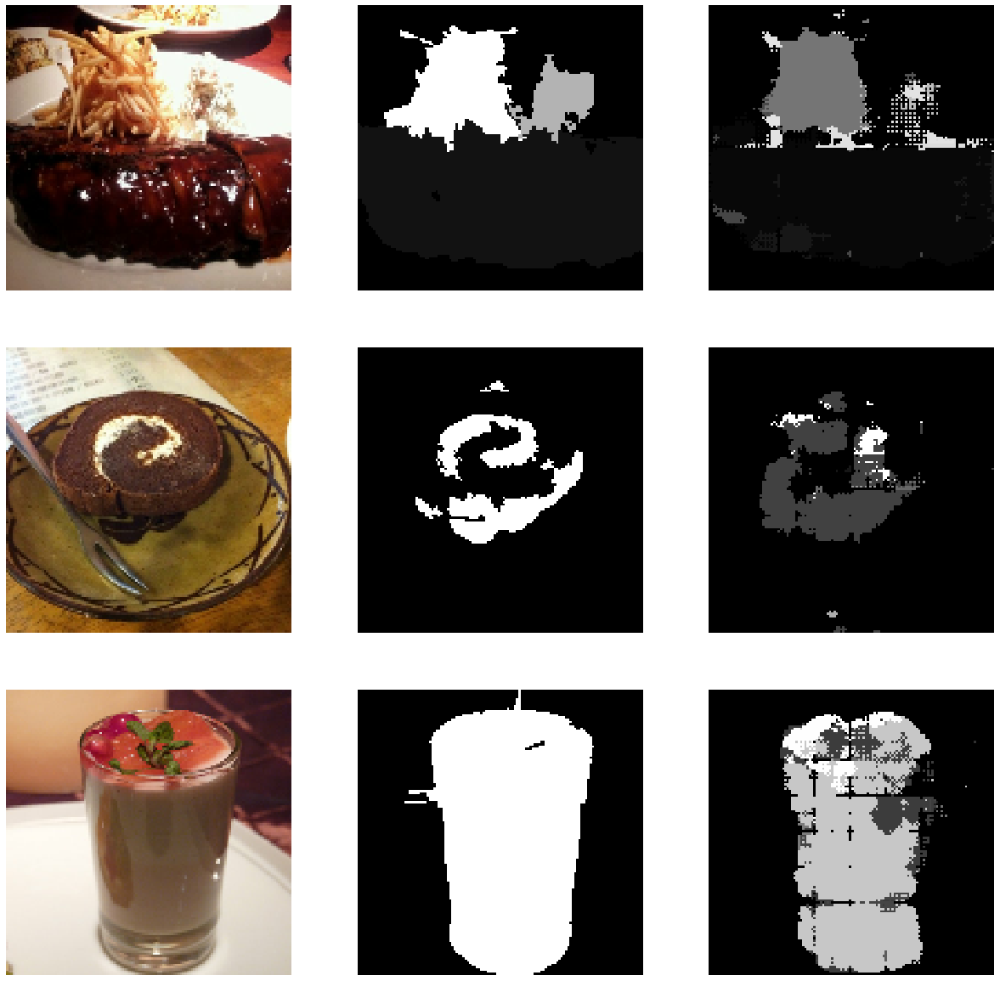


Epoch 00018: saving model to checkpoints/run_02\cp-0018.ckpt
Epoch 19/30
453/453 [==============================] - 996s 2s/step - loss: 0.9396 - accuracy: 0.6284 - val_loss: 0.9525 - val_accuracy: 0.6075
(16, 128, 128, 1)
(16, 128, 128, 1)
(16, 128, 128, 1)


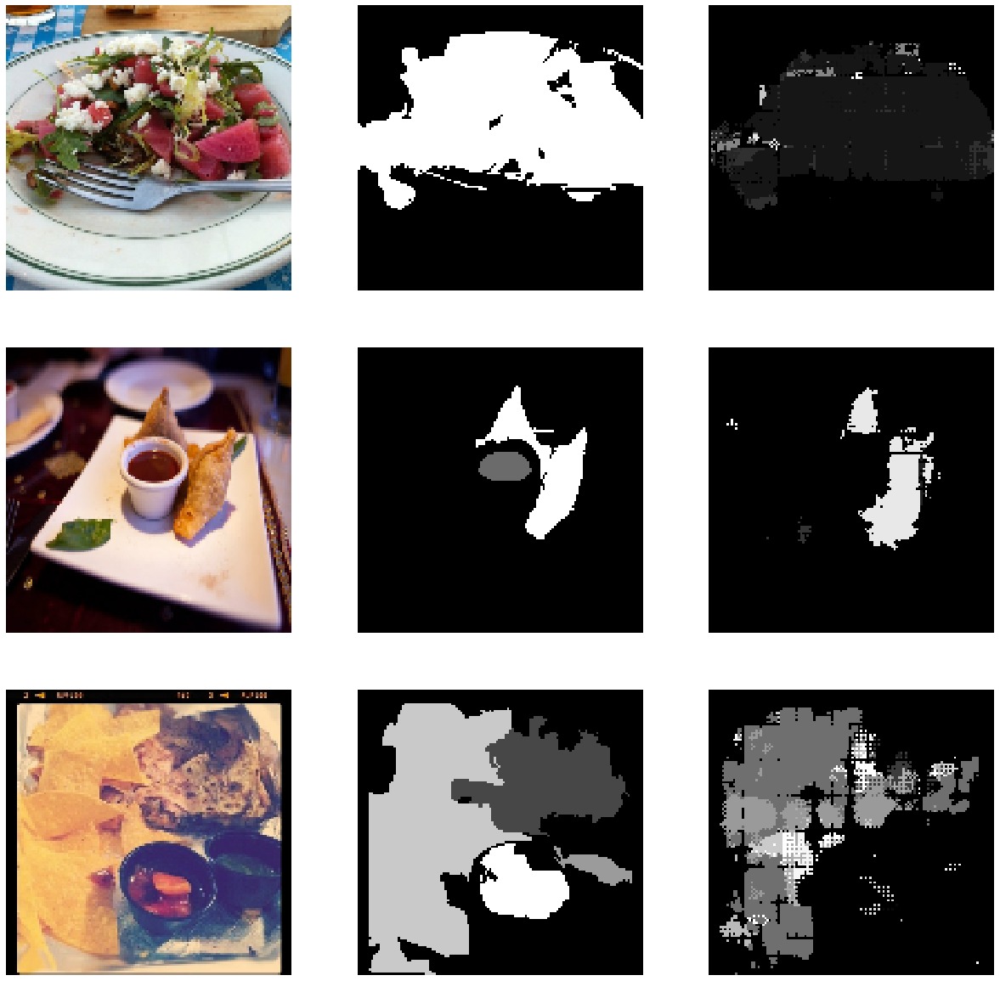


Epoch 00019: saving model to checkpoints/run_02\cp-0019.ckpt
Epoch 20/30
453/453 [==============================] - 990s 2s/step - loss: 0.8952 - accuracy: 0.6246 - val_loss: 0.9031 - val_accuracy: 0.6126
(16, 128, 128, 1)
(16, 128, 128, 1)
(16, 128, 128, 1)


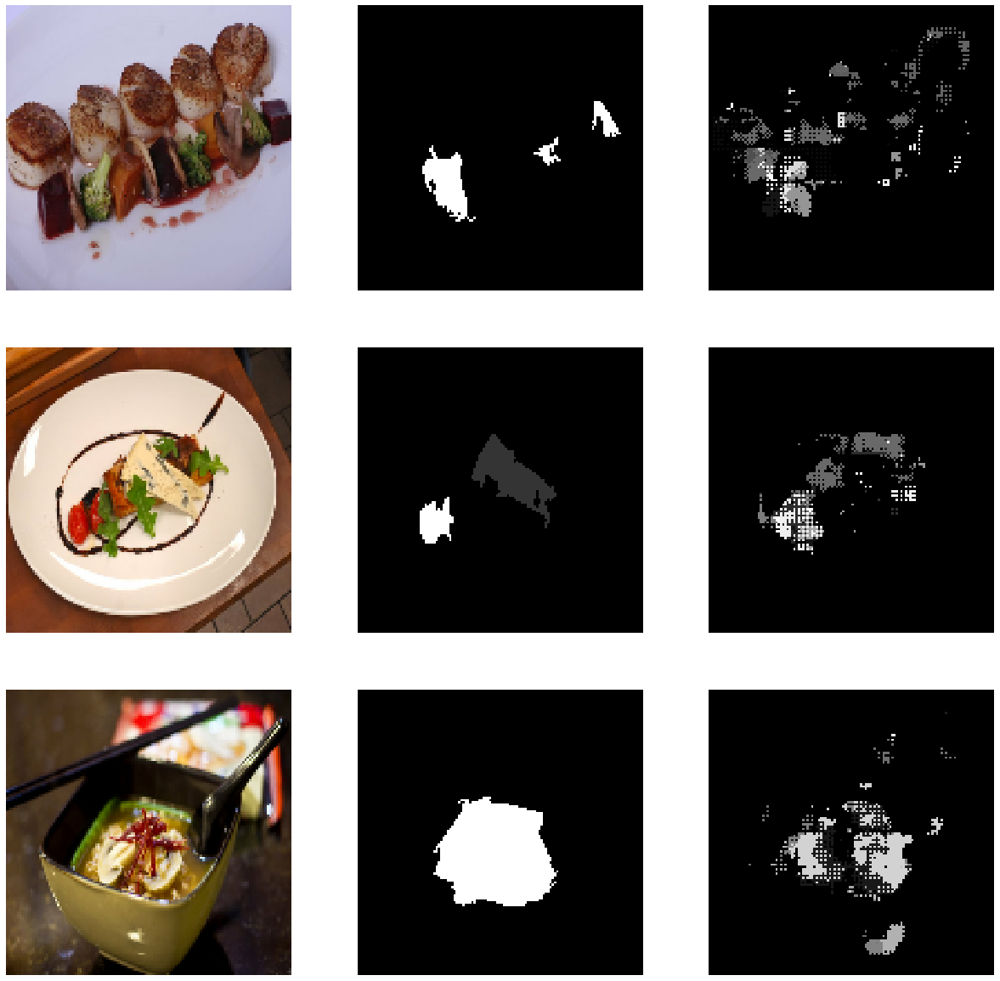


Epoch 00020: saving model to checkpoints/run_02\cp-0020.ckpt
Epoch 21/30
453/453 [==============================] - 975s 2s/step - loss: 0.8384 - accuracy: 0.6212 - val_loss: 0.8506 - val_accuracy: 0.6509
(16, 128, 128, 1)
(16, 128, 128, 1)
(16, 128, 128, 1)


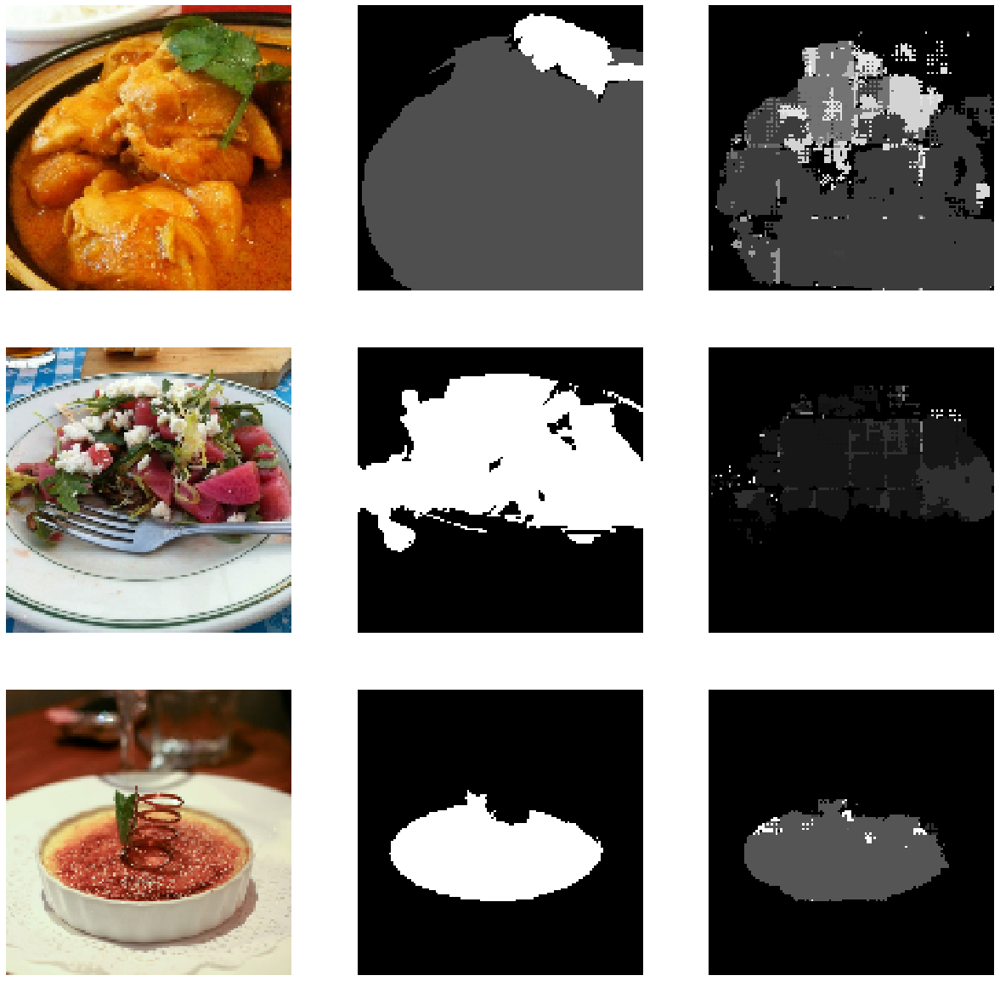


Epoch 00021: saving model to checkpoints/run_02\cp-0021.ckpt
Epoch 22/30
453/453 [==============================] - 978s 2s/step - loss: 0.7955 - accuracy: 0.6185 - val_loss: 0.8565 - val_accuracy: 0.6107
(16, 128, 128, 1)
(16, 128, 128, 1)
(16, 128, 128, 1)


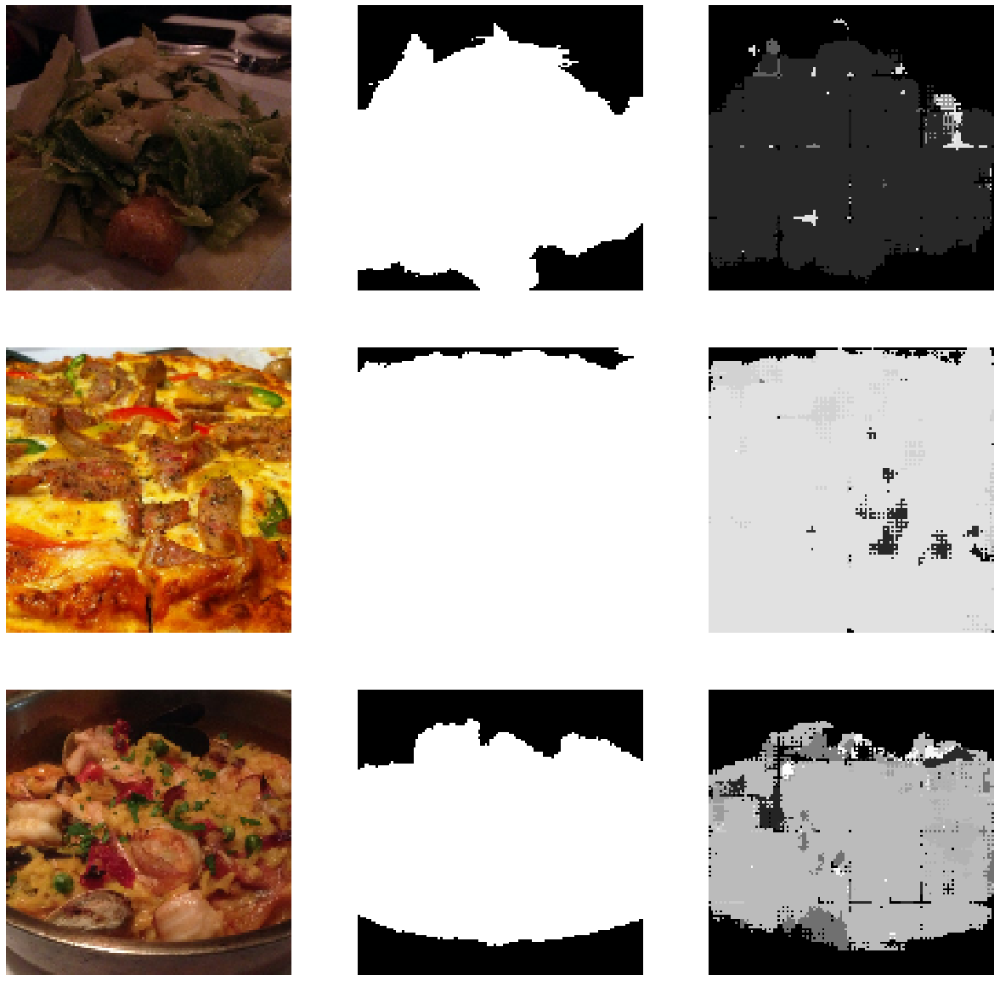


Epoch 00022: saving model to checkpoints/run_02\cp-0022.ckpt
Epoch 23/30
453/453 [==============================] - 994s 2s/step - loss: 0.7626 - accuracy: 0.6151 - val_loss: 0.8124 - val_accuracy: 0.6089
(16, 128, 128, 1)
(16, 128, 128, 1)
(16, 128, 128, 1)


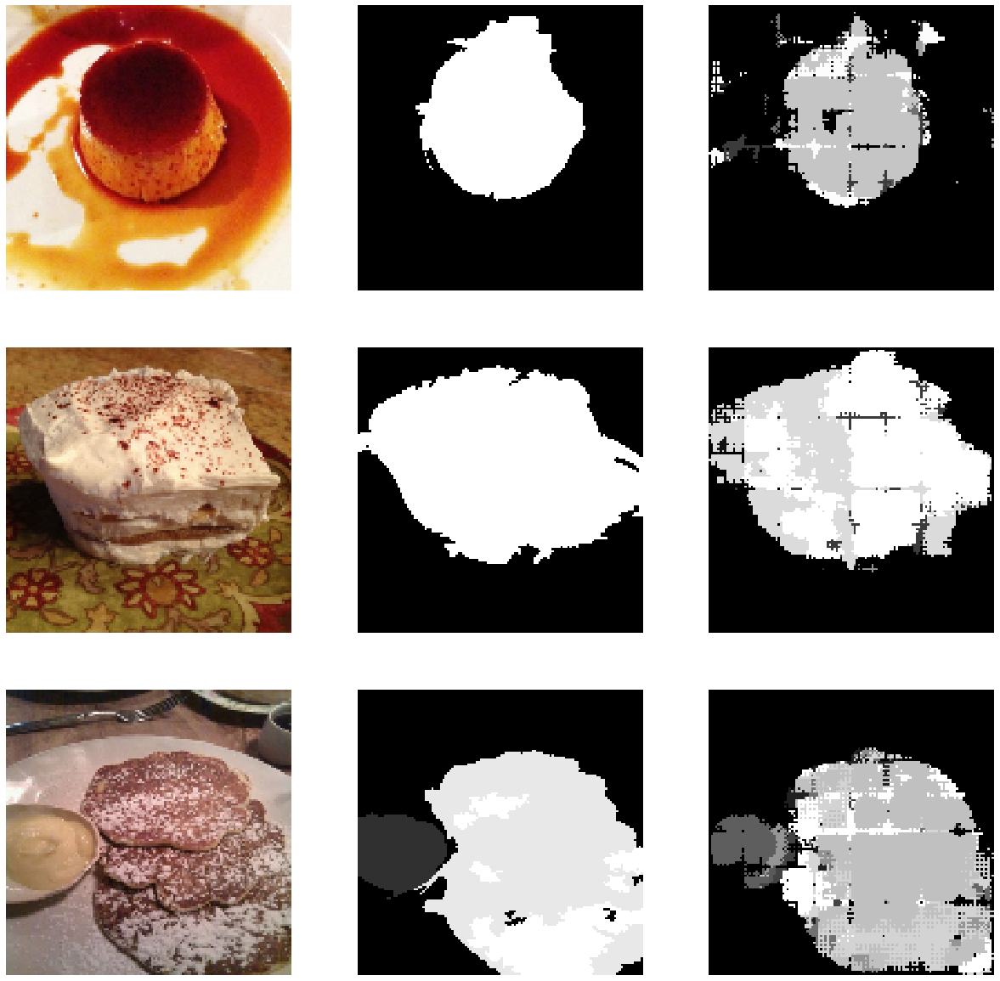


Epoch 00023: saving model to checkpoints/run_02\cp-0023.ckpt
Epoch 24/30
453/453 [==============================] - 1001s 2s/step - loss: 0.7297 - accuracy: 0.6129 - val_loss: 0.8005 - val_accuracy: 0.5839
(16, 128, 128, 1)
(16, 128, 128, 1)
(16, 128, 128, 1)


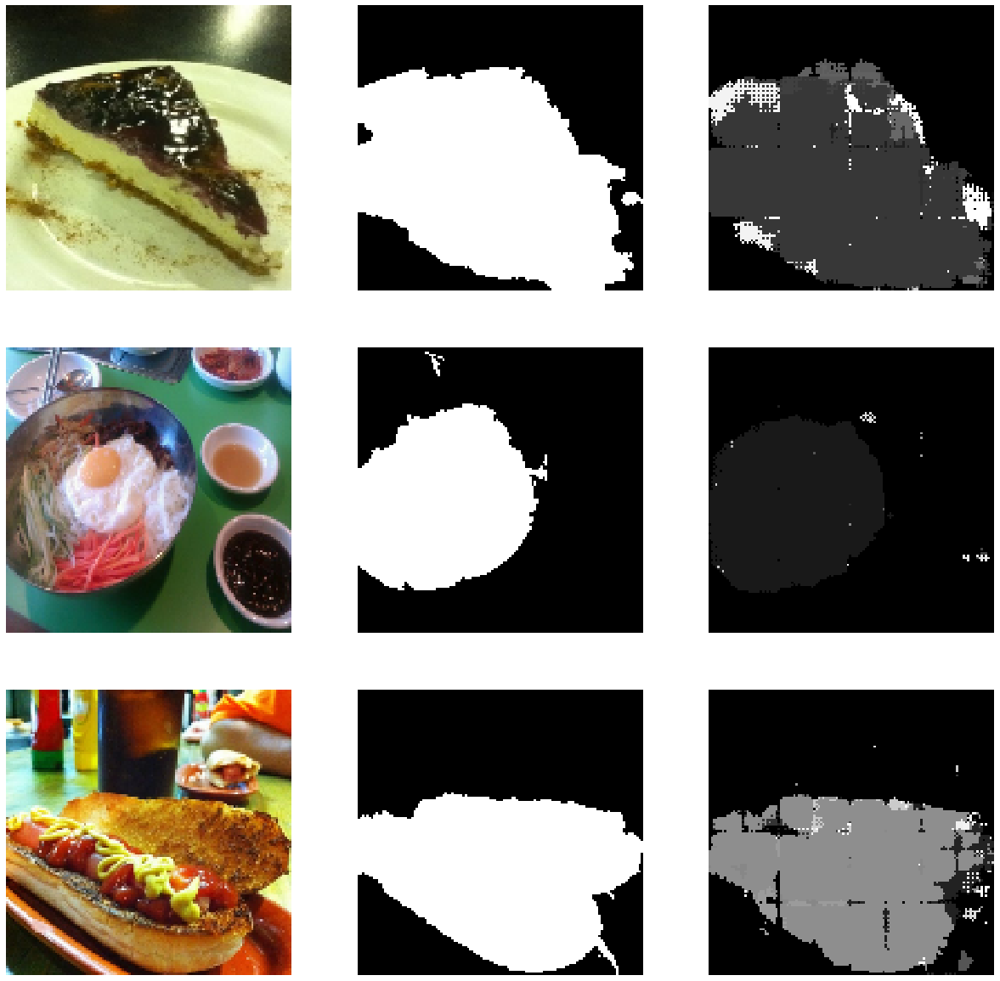


Epoch 00024: saving model to checkpoints/run_02\cp-0024.ckpt
Epoch 25/30
453/453 [==============================] - 985s 2s/step - loss: 0.6813 - accuracy: 0.6108 - val_loss: 0.7992 - val_accuracy: 0.6367
(16, 128, 128, 1)
(16, 128, 128, 1)
(16, 128, 128, 1)


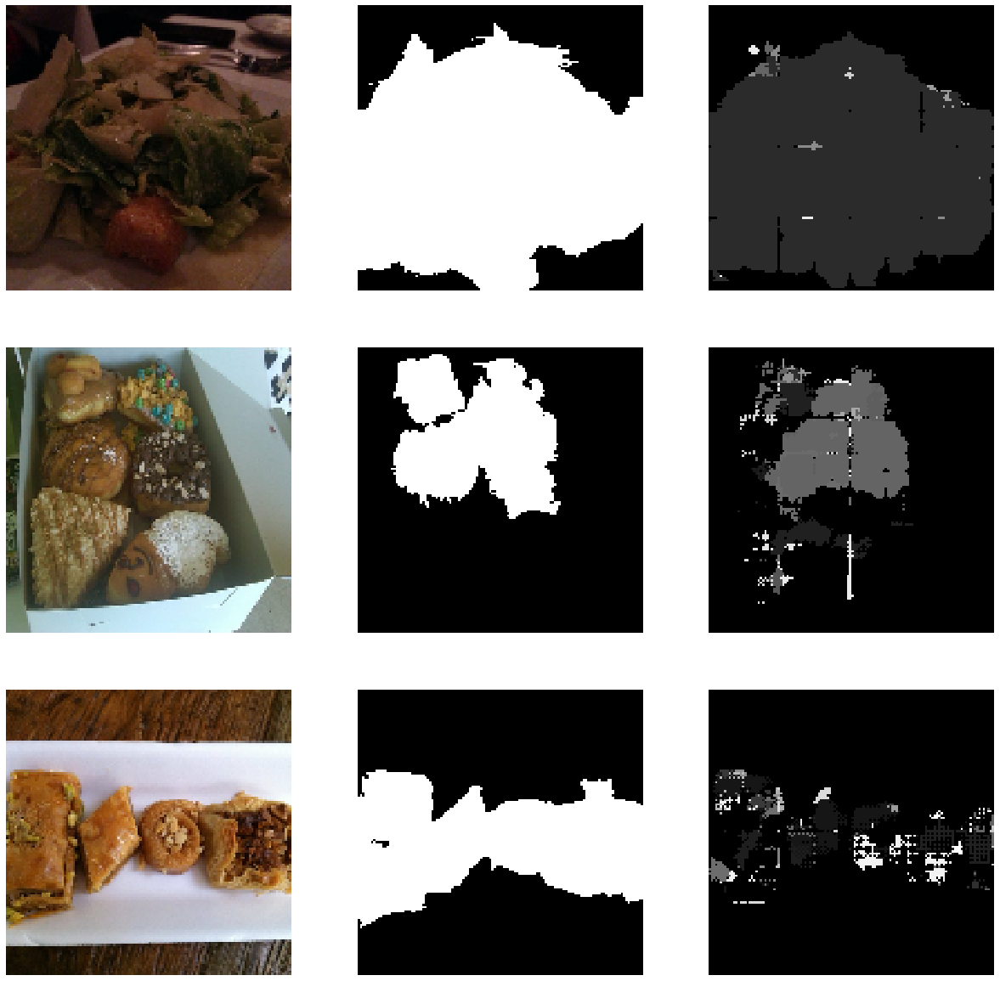


Epoch 00025: saving model to checkpoints/run_02\cp-0025.ckpt
Epoch 26/30
453/453 [==============================] - 995s 2s/step - loss: 0.6633 - accuracy: 0.6087 - val_loss: 0.7463 - val_accuracy: 0.5993
(16, 128, 128, 1)
(16, 128, 128, 1)
(16, 128, 128, 1)


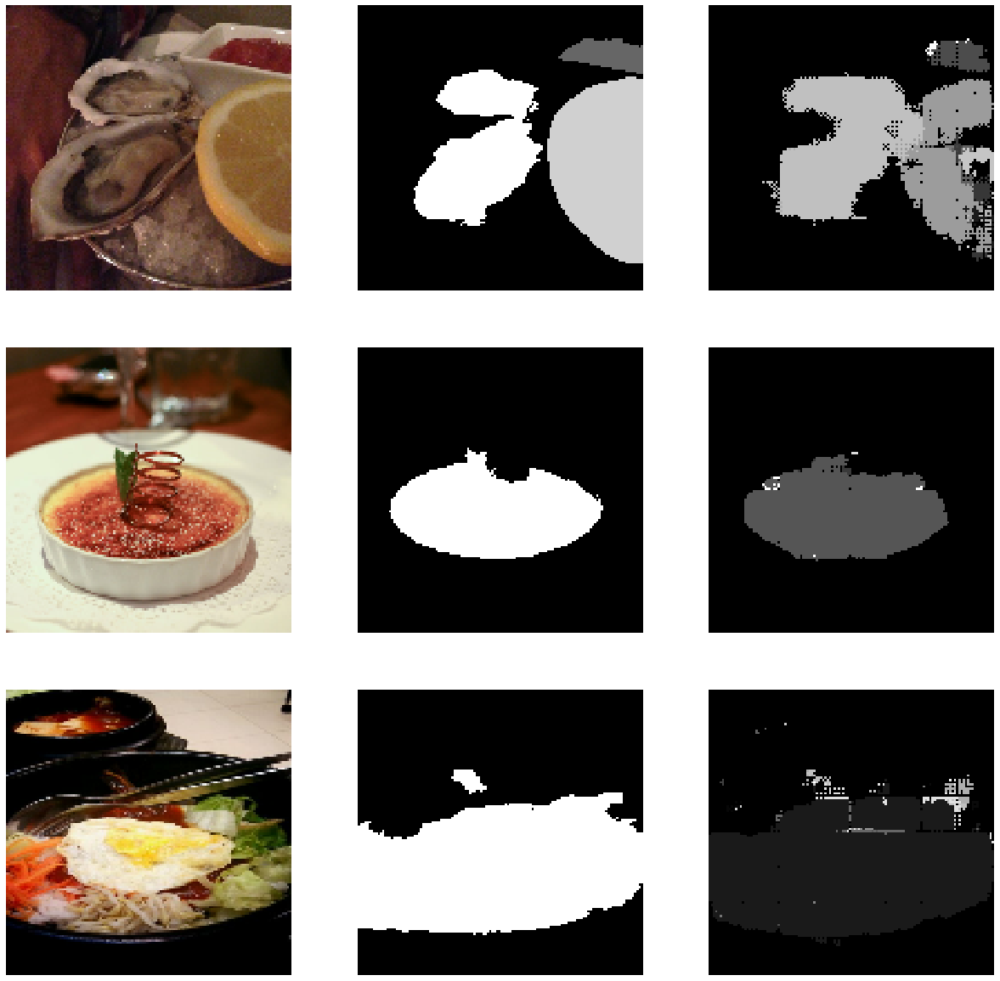


Epoch 00026: saving model to checkpoints/run_02\cp-0026.ckpt
Epoch 27/30
453/453 [==============================] - 1002s 2s/step - loss: 0.6310 - accuracy: 0.6064 - val_loss: 0.7646 - val_accuracy: 0.5871
(16, 128, 128, 1)
(16, 128, 128, 1)
(16, 128, 128, 1)


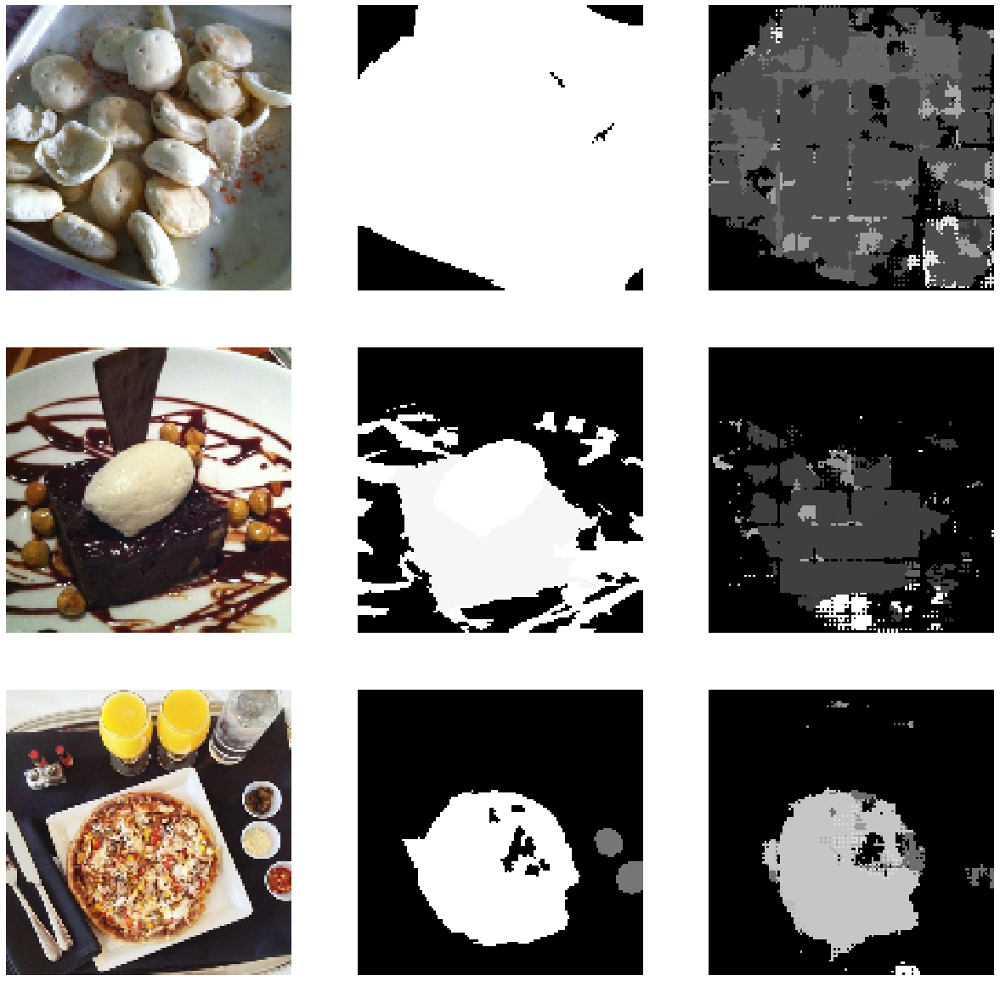


Epoch 00027: saving model to checkpoints/run_02\cp-0027.ckpt
Epoch 28/30
453/453 [==============================] - 1008s 2s/step - loss: 0.6065 - accuracy: 0.6050 - val_loss: 0.7039 - val_accuracy: 0.6037
(16, 128, 128, 1)
(16, 128, 128, 1)
(16, 128, 128, 1)


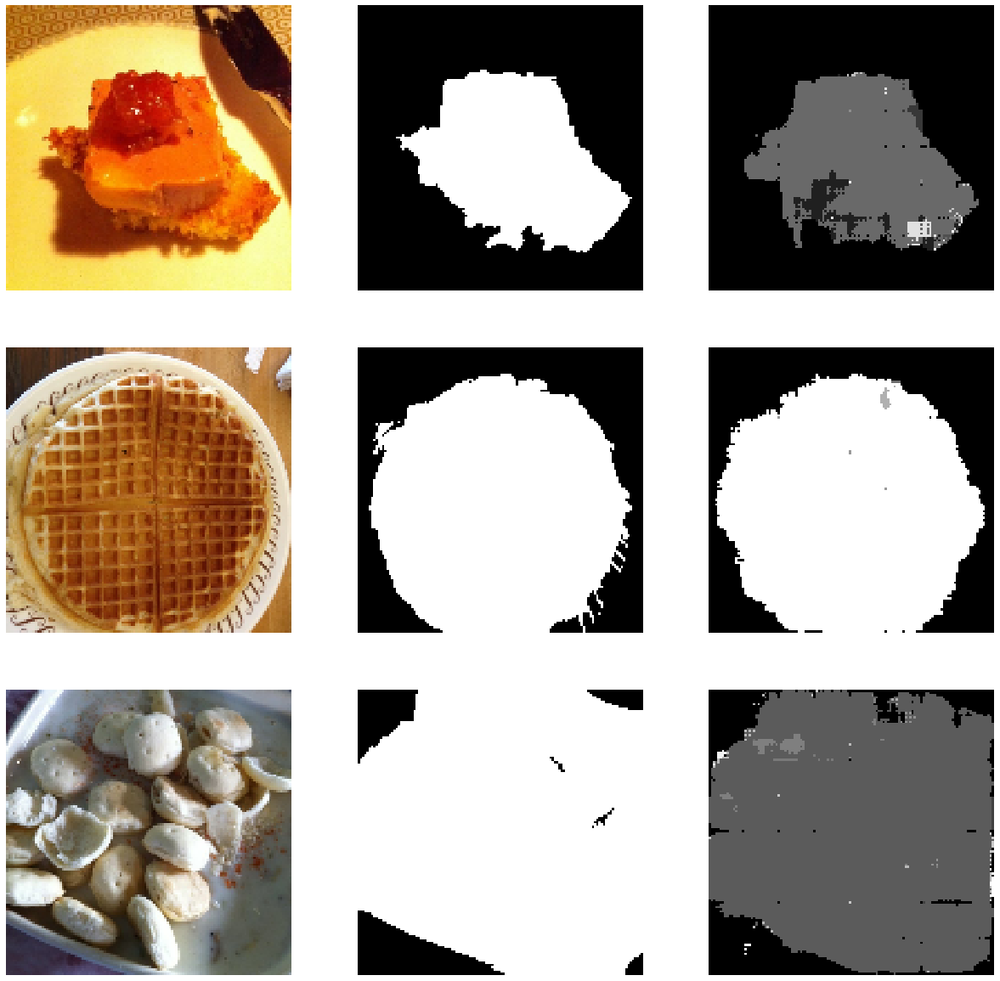


Epoch 00028: saving model to checkpoints/run_02\cp-0028.ckpt
Epoch 29/30
453/453 [==============================] - 1006s 2s/step - loss: 0.5759 - accuracy: 0.6034 - val_loss: 0.7182 - val_accuracy: 0.5924
(16, 128, 128, 1)
(16, 128, 128, 1)
(16, 128, 128, 1)


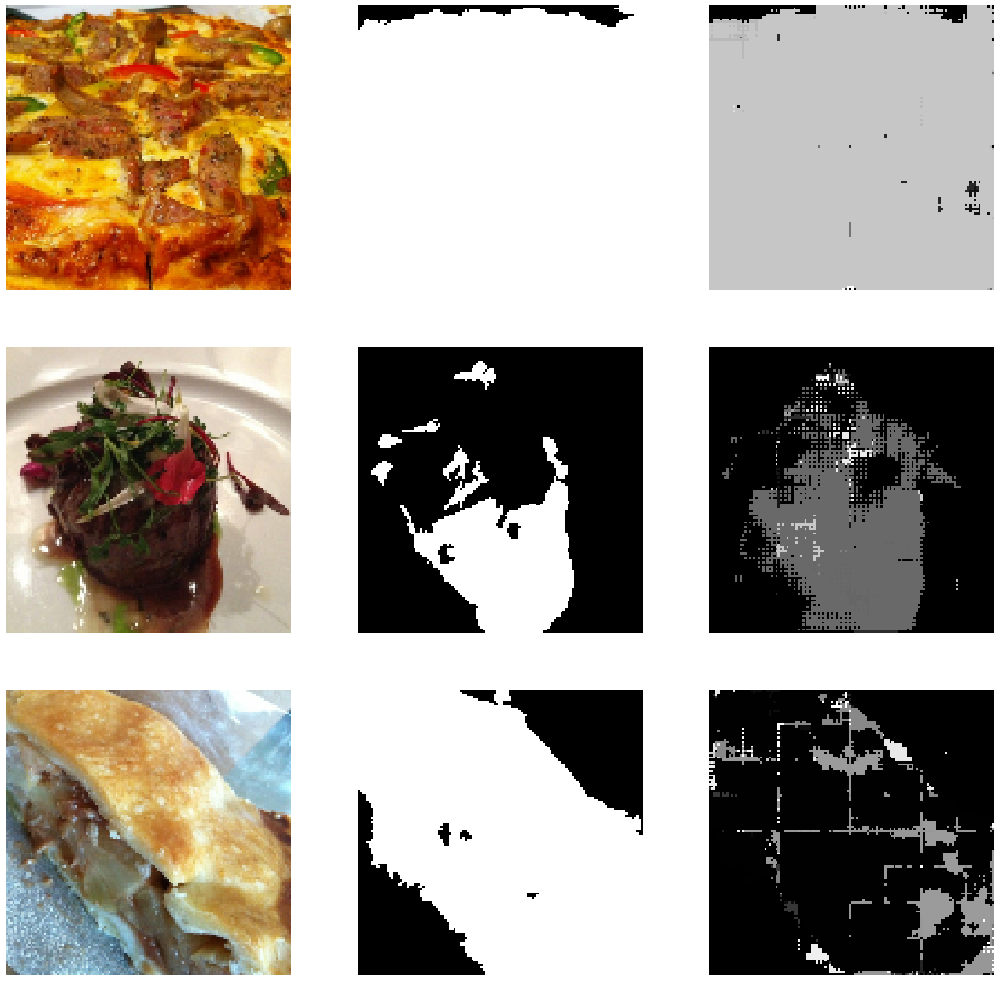


Epoch 00029: saving model to checkpoints/run_02\cp-0029.ckpt
Epoch 30/30
453/453 [==============================] - 1018s 2s/step - loss: 0.5591 - accuracy: 0.6016 - val_loss: 0.6732 - val_accuracy: 0.6135
(16, 128, 128, 1)
(16, 128, 128, 1)
(16, 128, 128, 1)


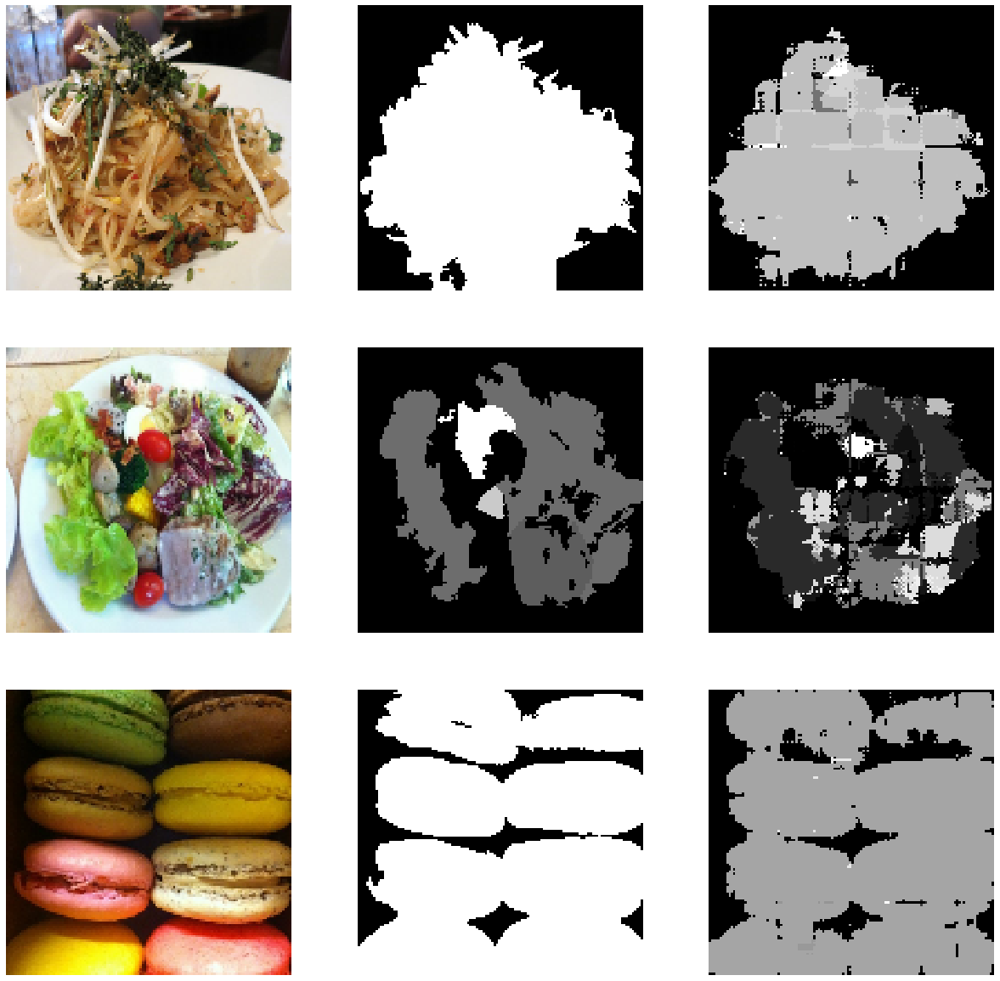


Epoch 00030: saving model to checkpoints/run_02\cp-0030.ckpt


In [89]:
model_history_fine = model.fit(train_data, epochs=EPOCHS+20, initial_epoch=model_history.epoch[-1], validation_data=val_data, callbacks=[MaskCallback(), cp_fine_callback])

In [93]:
loss = model_history.history['loss'].copy()
val_loss = model_history.history['val_loss'].copy()
loss += model_history_fine.history['loss'].copy()
val_loss += model_history_fine.history['val_loss'].copy()
epochs = range(EPOCHS + 21)

plt.figure()
plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'bo', label='Validation loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss Value')
plt.ylim([0, 5])
plt.legend()
plt.show()

ValueError: x and y must have same first dimension, but have shapes (31,) and (94,)

## Save and convert to `.tflite`

In [ ]:
MODEL_NAME = "/full_02"

In [ ]:
model.save(DRIVE_FOLDER + '/models/full_02')

In [ ]:
converter = tf.lite.TFLiteConverter.from_saved_model(DRIVE_FOLDER + '/models/full_02')
tflite_model = converter.convert()
open(DRIVE_FOLDER + "/tflite_models/full_01.tflite", "wb").write(tflite_model)

## Inspect tf-lite model for metadata

In [ ]:
interpreter = tf.lite.Interpreter(model_path=f"{DRIVE_FOLDER}/tflite_models/hamburger_hummus_01.tflite")

input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

In [ ]:
input_details

In [ ]:
output_details